# Calibration of the moisture sensor readings with different ML MODELS
### Grain Data

#### Following ML Models are used:
 1. MLR
 2. Ridge Regression
 3. Lasso Regression
 4. Support Vector Mechanism Regression
 5. KNN
 6. Random Forest
 7. ANN
 8. Ensemble
 9. Gaussian Process
 10. Kernel Regression
 11. ANN 2
 12. ANN 3

##### Workflow:
Machine Learning for Light Sensor Calibration (Yichao Zhang * , Lakitha O. H. Wijeratne , Shawhin Talebi and David J. Lary)
##### Reference Study:
1. https://github.com/marcelcases/calibration-sensors-machine-learning
2. https://github.com/yichigo/Light-Sensors-Calibration/blob/master/model_MLP_whole.ipynb


In [2]:
# Libraries

import pandas as pd
import numpy as np
import os
import sys
import datetime
import time
from pandas import Series
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor,AdaBoostRegressor,GradientBoostingRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler, MaxAbsScaler,Normalizer
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from sklearn.metrics import adjusted_rand_score, r2_score
from sklearn.feature_selection import mutual_info_regression
from sklearn.linear_model import LinearRegression

from sklearn.decomposition import PCA, FastICA
from sklearn.random_projection import GaussianRandomProjection
import pickle

from sklearn.linear_model import SGDRegressor
from sklearn.neighbors import KNeighborsRegressor

In [3]:
# Graph Libraries
import seaborn as sns

In [4]:
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

# Performance Measures FUNCTION

def loss_functions(y_true, y_pred):
    print("Loss functions:")
    print("* R-squared =", r2_score(y_true, y_pred))
    print("* RMSE =", np.sqrt(mean_squared_error(y_true, y_pred)))
    print("* MAE =", mean_absolute_error(y_true, y_pred))
    print("* MSE =", mean_squared_error(y_true, y_pred))

# DATA

In [5]:
df=pd.read_csv(r"C:\\Users\\bkari\\Desktop\\complete_data.csv")

In [6]:
# Drop of the Index column
df=df.iloc[:,1:]

In [7]:
df.columns

Index(['RefSt', 'Sensor', 'Gewicht', 'Raw_Feucht', 'Temp_grain',
       'SommerDurumweizen', 'SommerGerste', 'Weizen', 'WinterDurumweizen',
       'WinterGerste', 'WinterRaps', 'WinterRoggen', 'WinterTriticale',
       'WinterWeizen'],
      dtype='object')

### Workflow Design

In [8]:
# Selecting Feutures i.e X i.e Independent Variables

features=df[['Sensor','Gewicht', 'Raw_Feucht', 'Temp_grain', 'SommerDurumweizen', 'SommerGerste', 'Weizen', 'WinterDurumweizen',
             'WinterGerste', 'WinterRaps', 'WinterRoggen', 'WinterTriticale', 'WinterWeizen']]

In [9]:
#try



In [10]:
X=features
#X['Sensor_2']=((X['Sensor']*X['Raw_Feucht']))*X['WinterWeizen']   #FOR SGD

In [11]:
# Selecting Target Variable i.e Y i.e Dependent Variable
targets=df[['RefSt']]
Y=targets
#Y=np.round(targets,1)
#Y
#Y=np.round(Y,1) # DELETE
#Y

In [12]:
# Split the Data in Training and Test Set

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

In [13]:
# Scale the Data with Standard Scaler
scaler_x = StandardScaler()
X_train_scaled = scaler_x.fit_transform(X_train)
X_test_scaled = scaler_x.transform(X_test)

scaler_y = StandardScaler()
Y_train_scaled = scaler_y.fit_transform(Y_train)
Y_test_scaled = scaler_y.transform(Y_test)

In [14]:
PCA_n_number=13 #14 for the case of SGD otherwise 13

In [15]:
# Input Feutures PCA
RANDOM_STATE=42
pca1 = PCA(n_components=PCA_n_number, random_state = RANDOM_STATE)
X_temp = pca1.fit_transform(X_train_scaled[:,:])
print(pca1.explained_variance_)

[2.47204788e+00 1.53326841e+00 1.48874931e+00 1.22036745e+00
 1.13166865e+00 1.08839355e+00 1.06205784e+00 1.02029422e+00
 8.38926962e-01 6.28890007e-01 5.07362593e-01 9.94312353e-03
 6.90433211e-32]


In [16]:
#pd.DataFrame(X_temp).describe()

In [17]:
# PCA
n_components = PCA_n_number #

DR = 'PCA'
Cluster = 'None'
pca = PCA(n_components=n_components, random_state = RANDOM_STATE)

X_train_scaled_DR = pca.fit_transform(X_train_scaled)
X_test_scaled_DR = pca.transform(X_test_scaled)

X_train_scaled_DR = pd.DataFrame(X_train_scaled_DR)
X_test_scaled_DR = pd.DataFrame(X_test_scaled_DR)
print(pca.explained_variance_)

# save pca model
dir_DR = '../models/'
if not os.path.exists(dir_DR):
    os.mkdir(dir_DR)

fn_DR = dir_DR + DR + '.sav'
pickle.dump(pca, open(fn_DR, 'wb'))

[2.47204788e+00 1.53326841e+00 1.48874931e+00 1.22036745e+00
 1.13166865e+00 1.08839355e+00 1.06205784e+00 1.02029422e+00
 8.38926962e-01 6.28890007e-01 5.07362593e-01 9.94312353e-03
 6.90433211e-32]


In [18]:
## scale the data again before NN
scaler_x2 = StandardScaler()
X_train_scaled_DR_scaled = scaler_x2.fit_transform(X_train_scaled_DR)
X_test_scaled_DR_scaled = scaler_x2.transform(X_test_scaled_DR)

In [19]:
#****DataFrame for storing the ML Model results!

df_test=pd.DataFrame()
df_test['REAL']=Y_test_scaled.flatten()

In [20]:
Y_test_scaled

array([[-0.86913561],
       [-0.81175763],
       [-0.53530013],
       ...,
       [ 0.55488135],
       [-0.07627635],
       [ 0.01761488]])

# ML Calibration Models

#### Multiple Linear Regression with Stochastic Gradient Descend (SGD)

##### Huber

In [21]:
from sklearn.linear_model import HuberRegressor, LinearRegression
from sklearn.datasets import make_regression

In [22]:
huber = HuberRegressor().fit(X_train_scaled_DR_scaled, Y_train_scaled)
huber.score(X_test_scaled_DR_scaled, Y_test_scaled)


C:\Users\bkari\Anaconda3\lib\site-packages\sklearn\utils\validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)


0.7139613390124353

In [23]:
df_test['Huber']=huber.predict(X_test_scaled_DR_scaled)

In [24]:
loss_functions(df_test['REAL'],df_test['Huber'])

Loss functions:
* R-squared = 0.7139613390124353
* RMSE = 0.5493867353962523
* MAE = 0.3629476791480279
* MSE = 0.30182578502935165


##### Linear Regression (Classic Linear, SGD, Huber)

In [25]:
lin_reg=LinearRegression()

In [26]:
lin_reg.fit(X_train_scaled_DR_scaled,Y_train_scaled)

LinearRegression()

In [27]:
df_test["MLR_Pred"] = lin_reg.predict(X_test_scaled_DR_scaled)

In [28]:
loss_functions(df_test['REAL'],df_test['MLR_Pred'])

Loss functions:
* R-squared = 0.7198324094170363
* RMSE = 0.543719299731548
* MAE = 0.3666444691458391
* MSE = 0.29563067690056494


##### Polynom. Regression

In [29]:
from sklearn.preprocessing import PolynomialFeatures
poly_features=PolynomialFeatures(degree=2, include_bias=True)
X_full_train=poly_features.fit_transform(X_train_scaled_DR_scaled)
X_full_test=poly_features.fit_transform(X_test_scaled_DR_scaled)

lin_reg=LinearRegression()
lin_reg.fit(X_full_train,Y_train_scaled)

LinearRegression()

In [30]:
df_test['Polyn_Pred']=lin_reg.predict(X_full_test)

In [31]:
loss_functions(Y_test_scaled,df_test['Polyn_Pred'])

Loss functions:
* R-squared = 0.7639955900446815
* RMSE = 0.49902908725243245
* MAE = 0.3373600861270442
* MSE = 0.24903002992399584


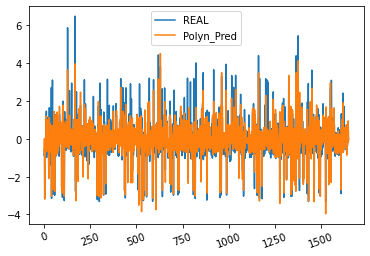

In [267]:
# Fast Check

df_test[["REAL","Polyn_Pred"]].plot()

plt.xticks(rotation = 20)
plt.show()

##### SGD Model

In [56]:
#Model
sgdr = SGDRegressor(loss = 'squared_loss',penalty='l2', max_iter = 500, shuffle=True, learning_rate='invscaling',average=2,alpha=0.001)

In [57]:
#Model FIT

sgdr.fit(X_train_scaled_DR_scaled, Y_train_scaled)

C:\Users\bkari\Anaconda3\lib\site-packages\sklearn\utils\validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)


SGDRegressor(alpha=0.001, average=2, max_iter=500)

In [58]:
#Model Coefficients

print('Intercept: \n', sgdr.intercept_)
print('Coefficients: \n', sgdr.coef_)
print('Iters: \n', sgdr.n_iter_)
print(sgdr.get_params())


Intercept: 
 [7.87070204e-05]
Coefficients: 
 [ 0.73805995  0.12677108  0.11582108 -0.20210279 -0.05849671 -0.07142774
  0.06258008 -0.00857858  0.01308328  0.25622323 -0.09165393 -0.119247
  0.00416341]
Iters: 
 7
{'alpha': 0.001, 'average': 2, 'early_stopping': False, 'epsilon': 0.1, 'eta0': 0.01, 'fit_intercept': True, 'l1_ratio': 0.15, 'learning_rate': 'invscaling', 'loss': 'squared_loss', 'max_iter': 500, 'n_iter_no_change': 5, 'penalty': 'l2', 'power_t': 0.25, 'random_state': None, 'shuffle': True, 'tol': 0.001, 'validation_fraction': 0.1, 'verbose': 0, 'warm_start': False}


In [59]:
#Predict on Test

df_test["MLR_SGD_Pred"] = sgdr.predict(X_test_scaled_DR_scaled)

In [60]:
df_test["MLR_SGD_Pred"]

0      -0.462940
1       0.004895
2       0.035272
3      -3.207640
4      -0.586878
          ...   
1646   -0.103241
1647    0.183653
1648    0.954516
1649    0.053161
1650    0.505205
Name: MLR_SGD_Pred, Length: 1651, dtype: float64

In [61]:
# Performance ASSESMENT!

loss_functions(Y_test_scaled,df_test["MLR_SGD_Pred"])

Loss functions:
* R-squared = 0.7191748000144695
* RMSE = 0.5443570347310764
* MAE = 0.3665465015422271
* MSE = 0.29632458126121036


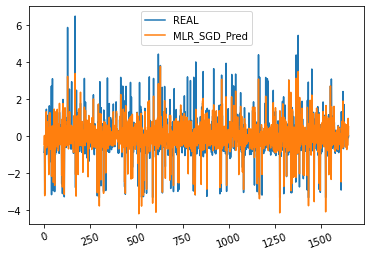

In [62]:
# Fast Check

df_test[["REAL","MLR_SGD_Pred"]].plot()

plt.xticks(rotation = 20)
plt.show()

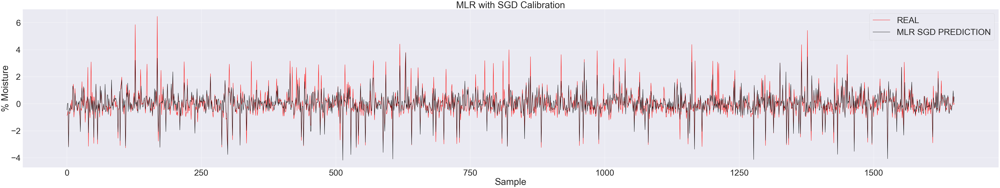

In [63]:
# Graph

sns.set(rc={'axes.facecolor':'gray', 'figure.facecolor':'gray'})
sns.set(font_scale=4)
fig, ax = plt.subplots(figsize=(90,15))
#ylim=(0,8251)
ax=sns.lineplot(y="REAL",x=range(0,1651) ,data=df_test, color="red") #REAL Values
sns.lineplot(y="MLR_SGD_Pred",x=range(0,1651),data=df_test, color="black").set(title='MLR with SGD Calibration') #Calibrated
plt.legend(labels = ['REAL', 'MLR SGD PREDICTION'])
ax.set(ylabel="% Moisture",xlabel="Sample")
plt.show()

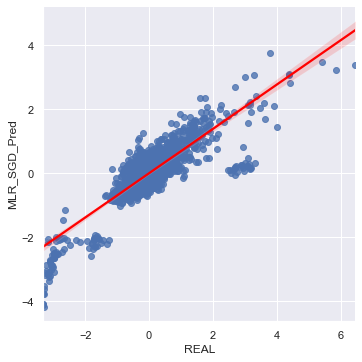

In [64]:
# Improved Scatter Plot

sns.set(font_scale=1)

sns.lmplot(x = 'REAL', y = 'MLR_SGD_Pred', data = df_test, fit_reg = True, line_kws = {'color': 'red'})

plt.show()

##### Lasso Regression


In [77]:
from sklearn.linear_model import Lasso
laso_reg=Lasso(alpha=0.0001)

In [78]:
laso_reg.fit(X_train_scaled_DR_scaled,Y_train_scaled)

Lasso(alpha=0.0001)

In [79]:
df_test['Lasso']=laso_reg.predict(X_test_scaled_DR_scaled)

In [80]:
loss_functions(Y_test_scaled,df_test['Lasso'])

Loss functions:
* R-squared = 0.7198329374956391
* RMSE = 0.5437187873120658
* MAE = 0.3666416196914025
* MSE = 0.2956301196761034


#### KNN Regression

In [90]:
# Model
knn = KNeighborsRegressor(n_neighbors = 10,p = 1)        #p = 1 Manhatten (each direction), p=2 (Eudclidian)

In [91]:
# Fit
knn.fit(X_train_scaled_DR_scaled, Y_train_scaled)

KNeighborsRegressor(n_neighbors=10, p=1)

In [92]:
# Predict
df_test["KNN_Pred"] = knn.predict(X_test_scaled_DR_scaled)

In [93]:
# Performance Assesment

loss_functions(df_test['REAL'],df_test['KNN_Pred'])

Loss functions:
* R-squared = 0.8693821496949763
* RMSE = 0.37125051708799556
* MAE = 0.2538118301322185
* MSE = 0.1378269464381041


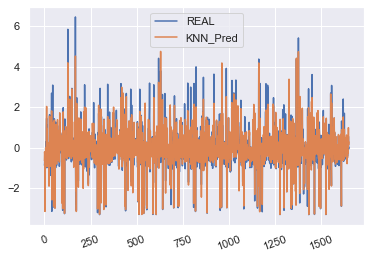

In [94]:
# Fast Check

df_test[["REAL","KNN_Pred"]].plot()

plt.xticks(rotation = 20)
plt.show()

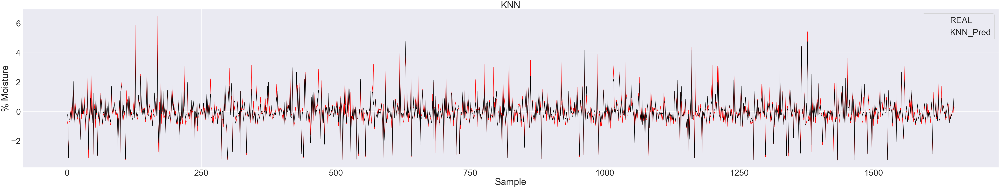

In [95]:
# Graph

sns.set(rc={'axes.facecolor':'gray', 'figure.facecolor':'gray'})
sns.set(font_scale=4)
fig, ax = plt.subplots(figsize=(90,15))
#ylim=(0,8251)
ax=sns.lineplot(y="REAL",x=range(0,1651) ,data=df_test, color="red") #REAL Values
sns.lineplot(y="KNN_Pred",x=range(0,1651),data=df_test, color="black").set(title='KNN') #Calibrated
plt.legend(labels = ['REAL', 'KNN_Pred'])
ax.set(ylabel="% Moisture",xlabel="Sample")
plt.show()

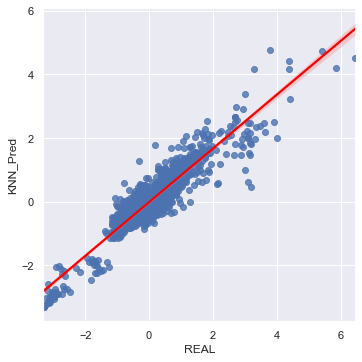

In [96]:
# Improved Scatter Plot

sns.set(font_scale=1)

sns.lmplot(x = 'REAL', y = 'KNN_Pred', data = df_test, fit_reg = True, line_kws = {'color': 'red'})

plt.show()

In [413]:
import plotly.express as px
# Create a mesh grid on which we will run our model
import plotly.graph_objects as go

mesh_size = .02
x_min, x_max = X_train.Sensor.min() - 0, X_train.Sensor.max() + 0
y_min, y_max = Y_train.RefSt.min() - 0, Y_train.RefSt.max() + 0
xrange = np.arange(x_min, x_max, mesh_size)
yrange = np.arange(y_min, y_max, mesh_size)
xx, yy = np.meshgrid(xrange, yrange)

pred=knn.predict(X_train)
#pred = pred.reshape(xx.shape)

fig = px.scatter_3d(X_train, x='Sensor', y='Raw_Feucht', z='Gewicht',
                    color='Sensor',symbol='WinterWeizen',width=1000, height=800)
fig.add_traces(go.Surface(x=xrange, y=yrange, z=pred, name='pred_surface'))
fig.show()
fig.show()

#### Random Forest

In [486]:
# Model
rf = RandomForestRegressor(n_estimators = 70 ,random_state = 42, max_features='sqrt')

In [487]:
# Fit
rf.fit(X_train_scaled_DR_scaled, Y_train_scaled)

<ipython-input-487-2c29c474f713>:2: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



RandomForestRegressor(max_features='sqrt', n_estimators=70, random_state=42)

In [488]:
# Predict
df_test["RF_Pred"] = rf.predict(X_test_scaled_DR_scaled)
print(df_test.head(2))

       REAL  Polyn_Pred     Lasso  SVR_RBF_Pred  SVR_Line_Pred  SVR_Poly_Pred  \
0 -0.869136   -0.690793 -0.457043     -0.496213      -0.536685      -0.492523   
1 -0.811758   -0.015938  0.007576     -0.145481      -0.077062      -0.071831   

   KNN_Pred   RF_Pred  
0 -0.644318 -0.670176  
1 -0.211375 -0.135368  


In [489]:
# ASSESMENT

loss_functions(df_test['REAL'],df_test['RF_Pred'])

Loss functions:
* R-squared = 0.8803596208646198
* RMSE = 0.35530775909915235
* MAE = 0.2441704513301061
* MSE = 0.1262436036760613


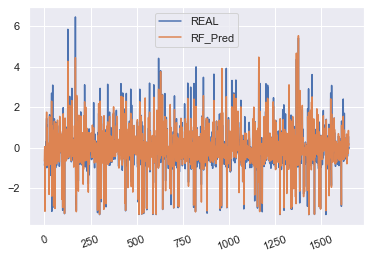

In [490]:
sns.set(font_scale=1)
df_test[["REAL", "RF_Pred"]].plot()
plt.xticks(rotation = 20)
plt.show()

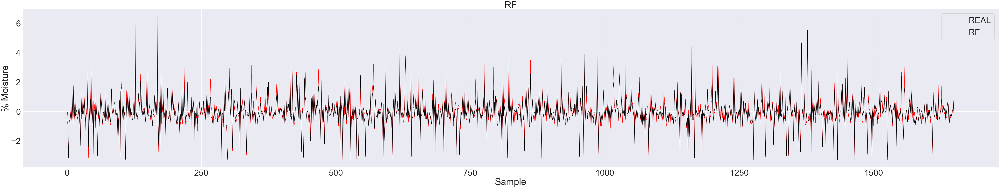

In [492]:
# Graph

sns.set(rc={'axes.facecolor':'gray', 'figure.facecolor':'gray'})
sns.set(font_scale=4)
fig, ax = plt.subplots(figsize=(90,15))
#ylim=(0,8251)
ax=sns.lineplot(y="REAL",x=range(0,1651) ,data=df_test, color="red") #REAL Values
sns.lineplot(y="RF_Pred",x=range(0,1651),data=df_test, color="black").set(title='RF') #Calibrated
plt.legend(labels = ['REAL', 'RF'])
ax.set(ylabel="% Moisture",xlabel="Sample")
plt.show()

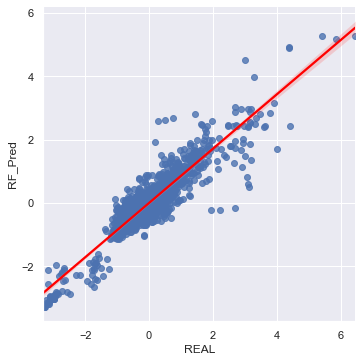

In [57]:
# Improved Scatter Plot

sns.set(font_scale=1)

sns.lmplot(x = 'REAL', y = 'RF_Pred', data = df_test, fit_reg = True, line_kws = {'color': 'red'})

plt.show()

#### SVM - kernel RBF

In [98]:
from sklearn.svm import SVR

C:\Users\bkari\Anaconda3\lib\site-packages\sklearn\utils\validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)


Loss functions:
* R-squared = 0.8049324772421937
* RMSE = 0.4536890376098135
* MAE = 0.3166711111761034
* MSE = 0.20583374284731878


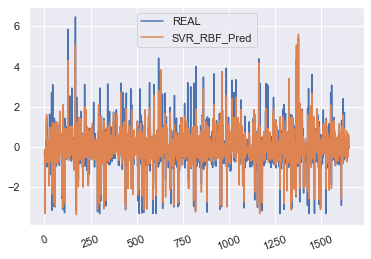

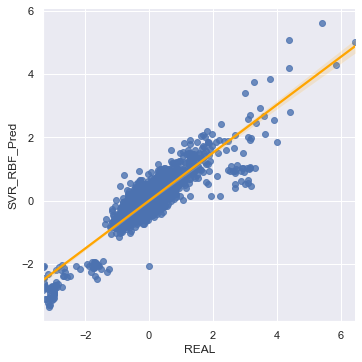

In [347]:
from sklearn.svm import SVR

# Models
svr_rbf = SVR(kernel = 'rbf', gamma='scale', epsilon=0.39 , C=6)#, gamma=0.039)


# Fit
svr_rbf.fit(X_train_scaled_DR_scaled, Y_train_scaled)


# Predict
df_test["SVR_RBF_Pred"] = svr_rbf.predict(X_test_scaled_DR_scaled)


# Plot linear
sns.set(font_scale=1)
df_test[["REAL", "SVR_RBF_Pred"]].plot()
plt.xticks(rotation=20)


# Plot regression
sns.set(font_scale=1)
sns.lmplot(x = 'REAL', y = 'SVR_RBF_Pred', data = df_test, fit_reg = True, line_kws = {'color': 'orange'})


# Loss
loss_functions(y_true = df_test["REAL"], y_pred = df_test["SVR_RBF_Pred"])




#### SVM - kernel Linear

C:\Users\bkari\Anaconda3\lib\site-packages\sklearn\utils\validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)


Loss functions:
* R-squared = 0.7125577537388219
* RMSE = 0.5507330000693882
* MAE = 0.36296049501647554
* MSE = 0.30330683736542874


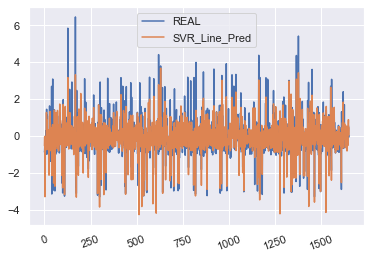

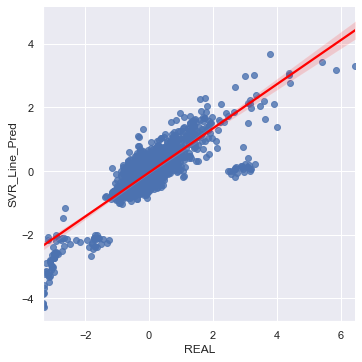

In [348]:
# Models
svr_lin = SVR(kernel = 'linear', gamma='scale', C=5)#, gamma=C = 1e3)


# Fit

svr_lin.fit(X_train_scaled_DR_scaled, Y_train_scaled)


# Predict

df_test["SVR_Line_Pred"] = svr_lin.predict(X_test_scaled_DR_scaled)


# Plot linear
sns.set(font_scale=1)
df_test[["REAL", "SVR_Line_Pred"]].plot()
plt.xticks(rotation=20)


# Plot regression
sns.set(font_scale=1)

sns.lmplot(x = 'REAL', y = 'SVR_Line_Pred', data = df_test, fit_reg = True, line_kws = {'color': 'red'})


# Loss

loss_functions(y_true = df_test["REAL"], y_pred = df_test["SVR_Line_Pred"])




#### SVM - kernel Poly

C:\Users\bkari\Anaconda3\lib\site-packages\sklearn\utils\validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)


Loss functions:
* R-squared = 0.7555771589575767
* RMSE = 0.507851448125406
* MAE = 0.32710804056144804
* MSE = 0.2579130933630719


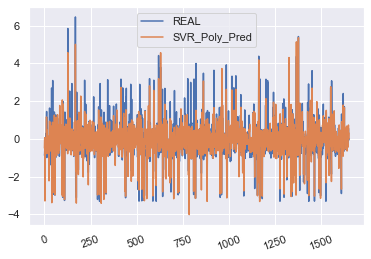

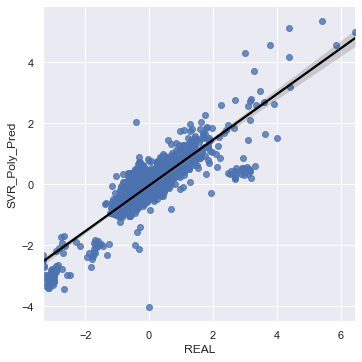

In [100]:
# Models
svr_poly = SVR(kernel = 'poly', degree=3, gamma='auto', epsilon=0.18 , C=2)#, gamma=0.1)


# Fit


svr_poly.fit(X_train_scaled_DR_scaled, Y_train_scaled)

# Predict


df_test["SVR_Poly_Pred"] = svr_poly.predict(X_test_scaled_DR_scaled)

# Plot linear
sns.set(font_scale=1)
df_test[["REAL", "SVR_Poly_Pred"]].plot()
plt.xticks(rotation=20)


# Plot regression
sns.set(font_scale=1)


sns.lmplot(x = 'REAL', y = 'SVR_Poly_Pred', data = df_test, fit_reg = True, line_kws = {'color': 'black'})

# Loss


loss_functions(y_true = df_test["REAL"], y_pred = df_test["SVR_Poly_Pred"])



#### ANN


In [216]:
hidden_layer_sizes=(64,128,256)

activation ='relu'
solver = 'adam'
alpha=1e-4 # L2 penalty (regularization term) parameter, default 1e-5
learning_rate = 'adaptive'
early_stopping = True
tol = 1e-4
n_iter_no_change = 10


# include layer structure and activation function
if type(hidden_layer_sizes) == int: # single-layer case
    hidden_layer_sizes_string = str(hidden_layer_sizes)
else: # multi-layers case
    hidden_layer_sizes_string = str(hidden_layer_sizes)[1:-1].replace(', ','_')

structure = '_' + DR + str(n_components) +\
            '_' + hidden_layer_sizes_string +\
            '_' + activation

In [217]:
start_time = time.time()

regr = MLPRegressor(random_state = RANDOM_STATE,
                    hidden_layer_sizes = hidden_layer_sizes,
                    activation = activation,
                    solver = solver,
                    alpha = alpha,
                    learning_rate = learning_rate,
                    verbose = True,
                    early_stopping = early_stopping,
                    tol = tol,
                    momentum=0.9,
                    n_iter_no_change = n_iter_no_change
                    )
regr.fit(X_train_scaled_DR_scaled, Y_train_scaled)

print("--- %s seconds ---" % (time.time() - start_time))

C:\Users\bkari\Anaconda3\lib\site-packages\sklearn\utils\validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)


Iteration 1, loss = 0.22301559
Validation score: 0.753327
Iteration 2, loss = 0.10549985
Validation score: 0.760076
Iteration 3, loss = 0.09777269
Validation score: 0.791194
Iteration 4, loss = 0.08748470
Validation score: 0.793078
Iteration 5, loss = 0.08565184
Validation score: 0.791345
Iteration 6, loss = 0.08236933
Validation score: 0.803185
Iteration 7, loss = 0.09128323
Validation score: 0.786045
Iteration 8, loss = 0.07892989
Validation score: 0.808713
Iteration 9, loss = 0.07612924
Validation score: 0.801995
Iteration 10, loss = 0.07363997
Validation score: 0.815974
Iteration 11, loss = 0.07283355
Validation score: 0.789605
Iteration 12, loss = 0.07351774
Validation score: 0.812736
Iteration 13, loss = 0.06966975
Validation score: 0.801872
Iteration 14, loss = 0.06840979
Validation score: 0.788459
Iteration 15, loss = 0.06848975
Validation score: 0.802944
Iteration 16, loss = 0.06745372
Validation score: 0.812804
Iteration 17, loss = 0.06671187
Validation score: 0.810122
Iterat

In [218]:
regr.warm_start = True
regr.learning_rate_init /= 10 # default 0.001
regr.fit(X_train_scaled_DR_scaled, Y_train_scaled)

Iteration 46, loss = 0.05531490
Validation score: 0.812084
Validation score did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.


C:\Users\bkari\Anaconda3\lib\site-packages\sklearn\utils\validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)


MLPRegressor(early_stopping=True, hidden_layer_sizes=(64, 128, 256),
             learning_rate='adaptive', learning_rate_init=0.0001,
             random_state=42, verbose=True, warm_start=True)

In [219]:
from sklearn.metrics import r2_score

Y_train_pred = scaler_y.inverse_transform(
    regr.predict( X_train_scaled_DR_scaled )
) # for train
# Y_train_pred = regr.predict( X_train_scaled_DR_scaled ) # for train
train_score = r2_score(Y_train, Y_train_pred)

Y_test_pred = scaler_y.inverse_transform(
    regr.predict( X_test_scaled_DR_scaled )
)# for test
# Y_test_pred = regr.predict( X_test_scaled_DR_scaled )# for test
test_score = r2_score(Y_test, Y_test_pred)

In [220]:
print(test_score)
print(train_score)

0.8696569747410037
0.8855039072185706


In [221]:
df_test['ANN']=regr.predict( X_test_scaled_DR_scaled )

In [222]:
loss_functions(df_test['REAL'],df_test['ANN'])

Loss functions:
* R-squared = 0.8696569747410037
* RMSE = 0.13753695317294007
* MAE = 0.2629089378165288


In [223]:
# ASSESMENT

loss_functions(df_test['REAL'],df_test['ANN'])

Loss functions:
* R-squared = 0.8696569747410037
* RMSE = 0.13753695317294007
* MAE = 0.2629089378165288


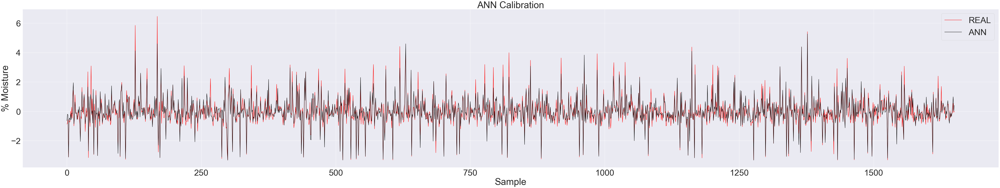

In [224]:
# Graph

sns.set(rc={'axes.facecolor':'gray', 'figure.facecolor':'gray'})
sns.set(font_scale=4)
fig, ax = plt.subplots(figsize=(90,15))
#ylim=(0,8251)
ax=sns.lineplot(y="REAL",x=range(0,1651) ,data=df_test, color="red") #REAL Values
sns.lineplot(y="ANN",x=range(0,1651),data=df_test, color="black").set(title='ANN Calibration') #Calibrated
plt.legend(labels = ['REAL', 'ANN'])
ax.set(ylabel="% Moisture",xlabel="Sample")
plt.show()

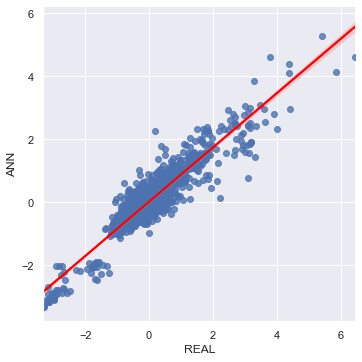

In [225]:
sns.set(font_scale=1)

sns.lmplot(x = 'REAL', y = 'ANN', data = df_test, fit_reg = True, line_kws = {'color': 'red'})

plt.show()

In [226]:
loss_functions(df_test['REAL'],df_test['ANN'])

Loss functions:
* R-squared = 0.8696569747410037
* RMSE = 0.13753695317294007
* MAE = 0.2629089378165288


#### Ridge Regression

In [101]:
from sklearn.linear_model import Ridge

In [102]:
model = Ridge(alpha=1.0)

In [103]:
model.fit(X_train_scaled_DR_scaled, Y_train_scaled)

Ridge()

In [104]:
df_test['Ridge_Pred']=model.predict(X_test_scaled_DR_scaled)

In [105]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedKFold
from sklearn.linear_model import Ridge

# define model evaluation method
cv = RepeatedKFold(n_splits=10, n_repeats=5, random_state=1)
# define grid
grid = dict()
grid['alpha'] = np.arange(0.01, 0.99, 0.01)
# define search
search = GridSearchCV(model, grid, scoring='explained_variance', cv=cv, n_jobs=-1)
# perform the search
results = search.fit(X_train_scaled_DR_scaled, Y_train_scaled)
# summarize
print('R2: %.3f' % results.best_score_)
print('Config: %s' % results.best_params_)

R2: 0.730
Config: {'alpha': 0.98}


In [106]:
loss_functions(df_test['REAL'],df_test['Ridge_Pred'])

Loss functions:
* R-squared = 0.7198262736770087
* RMSE = 0.5437252534930074
* MAE = 0.3666430651339734
* MSE = 0.2956371512860351


In [107]:
model = Ridge(alpha=0.98)
model.fit(X_train_scaled_DR_scaled, Y_train_scaled)

Ridge(alpha=0.98)

In [108]:
df_test['Ridge_Pred']=model.predict(X_test_scaled_DR_scaled)

In [109]:
loss_functions(df_test['REAL'],df_test['Ridge_Pred'])

Loss functions:
* R-squared = 0.7198263966793973
* RMSE = 0.54372513413936
* MAE = 0.36664309321004185
* MSE = 0.295637021494865


#### Lasso

In [110]:
from numpy import absolute
from pandas import read_csv
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RepeatedKFold
from sklearn.linear_model import Lasso

In [111]:
# define model
model = Lasso()
# define model evaluation method
cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)
# define grid
grid = dict()
grid['alpha'] = np.arange(0, 1, 0.01)
# define search
search = GridSearchCV(model, grid, scoring='neg_mean_absolute_error', cv=cv, n_jobs=-1)
# perform the search
results = search.fit(X_train_scaled_DR_scaled, Y_train_scaled)
# summarize
print('MAE: %.3f' % results.best_score_)
print('Config: %s' % results.best_params_)

MAE: -0.356
Config: {'alpha': 0.0}


C:\Users\bkari\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:765: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  self.best_estimator_.fit(X, y, **fit_params)
C:\Users\bkari\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  model = cd_fast.enet_coordinate_descent(
C:\Users\bkari\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 883.1359158813821, tolerance: 0.66
  model = cd_fast.enet_coordinate_descent(


In [120]:
model = Lasso(alpha=0.0001)

In [121]:
model.fit(X_train_scaled_DR_scaled,Y_train_scaled)

Lasso(alpha=0.0001)

In [122]:
df_test['Lasso']=model.predict(X_test_scaled_DR_scaled)

In [123]:
loss_functions(df_test['REAL'], df_test['Lasso'])

Loss functions:
* R-squared = 0.7198329374956391
* RMSE = 0.5437187873120658
* MAE = 0.3666416196914025
* MSE = 0.2956301196761034


#### Gaussian Process

RBF params {'alpha': 45, 'copy_X_train': True, 'kernel__k1': 1**2, 'kernel__k2': RBF(length_scale=1), 'kernel__k1__constant_value': 1.0, 'kernel__k1__constant_value_bounds': (1e-05, 100000.0), 'kernel__k2__length_scale': 1.0, 'kernel__k2__length_scale_bounds': (1e-05, 100000.0), 'kernel': 1**2 * RBF(length_scale=1), 'n_restarts_optimizer': 0, 'normalize_y': False, 'optimizer': 'fmin_l_bfgs_b', 'random_state': 0}
Dot params {'alpha': 45, 'copy_X_train': True, 'kernel__k1': DotProduct(sigma_0=1), 'kernel__k2': WhiteKernel(noise_level=1), 'kernel__k1__sigma_0': 1.0, 'kernel__k1__sigma_0_bounds': (1e-05, 100000.0), 'kernel__k2__noise_level': 1.0, 'kernel__k2__noise_level_bounds': (1e-05, 100000.0), 'kernel': DotProduct(sigma_0=1) + WhiteKernel(noise_level=1), 'n_restarts_optimizer': 0, 'normalize_y': False, 'optimizer': 'fmin_l_bfgs_b', 'random_state': 0}
Loss functions:
* R-squared = -0.0005112646175566837
* RMSE = 1.0274880807530293
* MAE = 0.6713733763335521
* MSE = 1.0557317560895438
L

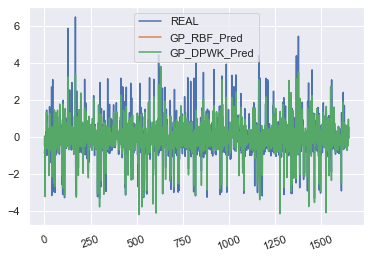

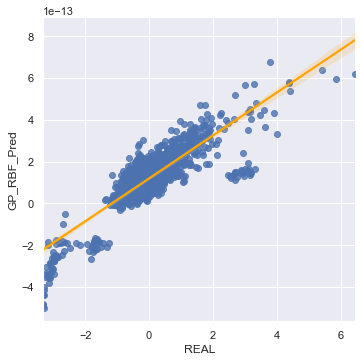

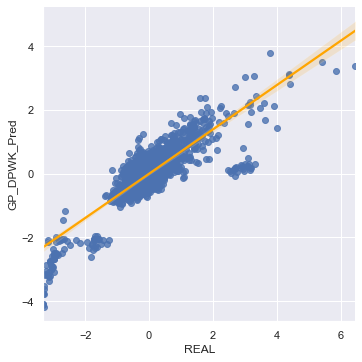

In [124]:
# %%
# Gaussian Process
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import ConstantKernel, RBF, DotProduct, WhiteKernel

# Kernels definition
#rbf = ConstantKernel(constant_value=1.0, constant_value_bounds=(1e-10, 1e10)) * RBF(length_scale=1.0, length_scale_bounds=(1e-10, 1e10))
rbf = ConstantKernel() * RBF()
dpwh = DotProduct() + WhiteKernel()

# Models
gp_rbf = GaussianProcessRegressor(kernel = rbf, alpha = 45, random_state = 0)
gp_dpwh = GaussianProcessRegressor(kernel = dpwh, alpha = 45, random_state = 0)

# Fit
gp_rbf.fit(X_train_scaled_DR_scaled, Y_train_scaled)
gp_dpwh.fit(X_train_scaled_DR_scaled, Y_train_scaled)

# Predict
df_test["GP_RBF_Pred"] = gp_rbf.predict(X_test_scaled_DR_scaled)
df_test["GP_DPWK_Pred"] = gp_dpwh.predict(X_test_scaled_DR_scaled)

# Obtain optimized kernel parameters
# l = gp.kernel_.k2.get_params()['length_scale']
# sigma_f = np.sqrt(gp.kernel_.k1.get_params()['constant_value'])

# Print parameters
print("RBF params", gp_rbf.get_params())
print("Dot params", gp_dpwh.get_params())

# Plot linear
df_test[["REAL", "GP_RBF_Pred", "GP_DPWK_Pred"]].plot()
plt.xticks(rotation = 20)

# Plot regression
sns.lmplot(x = 'REAL', y = 'GP_RBF_Pred', data = df_test, fit_reg = True, line_kws = {'color': 'orange'})
sns.lmplot(x = 'REAL', y = 'GP_DPWK_Pred', data = df_test, fit_reg = True, line_kws = {'color': 'orange'})

# Loss
loss_functions(y_true = df_test["REAL"], y_pred = df_test["GP_RBF_Pred"])
loss_functions(y_true = df_test["REAL"], y_pred = df_test["GP_DPWK_Pred"])



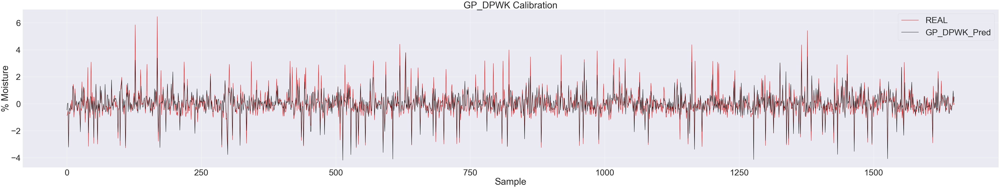

In [75]:
# Graph

sns.set(rc={'axes.facecolor':'gray', 'figure.facecolor':'gray'})
sns.set(font_scale=4)
fig, ax = plt.subplots(figsize=(90,15))
#ylim=(0,8251)
ax=sns.lineplot(y="REAL",x=range(0,1651) ,data=df_test, color="red") #REAL Values
sns.lineplot(y="GP_DPWK_Pred",x=range(0,1651),data=df_test, color="black").set(title='GP_DPWK Calibration') #Calibrated
plt.legend(labels = ['REAL', 'GP_DPWK_Pred'])
ax.set(ylabel="% Moisture",xlabel="Sample")
plt.show()

#### Bayesian Ridge

In [77]:
from sklearn.linear_model import BayesianRidge

In [78]:
model = BayesianRidge()
model.fit(X_train_scaled_DR_scaled, Y_train_scaled)

# Model making a prediction on test data
prediction = model.predict(X_test_scaled_DR_scaled)

# Evaluation of r2 score of the model against the test set
print(f"r2 Score Of Test Set : {r2_score(Y_test_scaled, prediction)}")

r2 Score Of Test Set : 0.7198029217641002


C:\Users\bkari\Anaconda3\lib\site-packages\sklearn\utils\validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)


#### ANN 2

In [848]:


import sklearn

from sklearn.model_selection import train_test_split

from sklearn.metrics import classification_report,roc_auc_score,confusion_matrix,accuracy_score,f1_score,roc_curve

from sklearn.preprocessing import LabelEncoder

from keras.preprocessing.sequence import pad_sequences

from keras.models import Sequential

from keras.callbacks import ReduceLROnPlateau, EarlyStopping

from keras.layers import Activation, Dense, Dropout, Embedding, LSTM

import re

from IPython.display import display

import os

import string

import time

import random

import matplotlib.pyplot as plt





In [402]:
#

print(X_train_scaled_DR_scaled.shape)
print(Y_train_scaled.shape)
print(X_test_scaled_DR_scaled.shape)
print(Y_test_scaled.shape)

(6600, 13)
(6600, 1)
(1651, 13)
(1651, 1)


In [403]:

# Installing required libraries
!pip install tensorflow
!pip install keras

In [405]:
# importing the libraries
from keras.models import Sequential
from keras.layers import Dense

# create ANN model
model = Sequential()

# Defining the Input layer and FIRST hidden layer, both are same!
model.add(Dense(units=5, input_dim=13, kernel_initializer='normal', activation='relu'))

# Defining the Second layer of the model
# after the first layer we don't have to specify input_dim as keras configure it automatically
model.add(Dense(units=5, kernel_initializer='normal', activation='tanh'))

# The output neuron is a single fully connected node
# Since we will be predicting a single number
model.add(Dense(1, kernel_initializer='normal'))

# Compiling the model
model.compile(loss='mean_squared_error', optimizer='adam')

# Fitting the ANN to the Training set
model.fit(X_train_scaled_DR_scaled, Y_train_scaled ,batch_size = 20, epochs = 50, verbose=1)

Epoch 1/50
330/330 [==============================] - 1s 922us/step - loss: 0.6911
Epoch 2/50
330/330 [==============================] - 0s 893us/step - loss: 0.2897
Epoch 3/50
330/330 [==============================] - 0s 981us/step - loss: 0.2581
Epoch 4/50
330/330 [==============================] - 0s 989us/step - loss: 0.2488
Epoch 5/50
330/330 [==============================] - 0s 1ms/step - loss: 0.2435
Epoch 6/50
330/330 [==============================] - 0s 1ms/step - loss: 0.2401
Epoch 7/50
330/330 [==============================] - 0s 1ms/step - loss: 0.2353
Epoch 8/50
330/330 [==============================] - 0s 920us/step - loss: 0.2327
Epoch 9/50
330/330 [==============================] - 0s 844us/step - loss: 0.2304
Epoch 10/50
330/330 [==============================] - 0s 826us/step - loss: 0.2279
Epoch 11/50
330/330 [==============================] - 0s 874us/step - loss: 0.2250
Epoch 12/50
330/330 [==============================] - 0s 964us/step - loss: 0.2241
Epoch 1

In [406]:


# Defining a function to find the best parameters for ANN
def FunctionFindBestParams(X_train, y_train, X_test, y_test):

    # Defining the list of hyper parameters to try
    batch_size_list=[5, 10, 15, 20]
    epoch_list  =   [5, 10, 50, 100]


    SearchResultsData=pd.DataFrame(columns=['TrialNumber', 'Parameters', 'Accuracy'])

    # initializing the trials
    TrialNumber=0
    for batch_size_trial in batch_size_list:
        for epochs_trial in epoch_list:
            TrialNumber+=1
            # create ANN model
            model = Sequential()
            # Defining the first layer of the model
            model.add(Dense(units=5, input_dim=X_train.shape[1], kernel_initializer='normal', activation='relu'))

            # Defining the Second layer of the model
            model.add(Dense(units=5, kernel_initializer='normal', activation='relu'))

            # The output neuron is a single fully connected node
            # Since we will be predicting a single number
            model.add(Dense(1, kernel_initializer='normal'))

            # Compiling the model
            model.compile(loss='mean_squared_error', optimizer='adam')

            # Fitting the ANN to the Training set
            model.fit(X_train, y_train ,batch_size = batch_size_trial, epochs = epochs_trial, verbose=0)

            MAPE = np.mean(100 * (np.abs(y_test-model.predict(X_test))/y_test))

            # printing the results of the current iteration
            print(TrialNumber, 'Parameters:','batch_size:', batch_size_trial,'-', 'epochs:',epochs_trial, 'Accuracy:', 100-MAPE)

            SearchResultsData=SearchResultsData.append(pd.DataFrame(data=[[TrialNumber, str(batch_size_trial)+'-'+str(epochs_trial), 100-MAPE]],
                                                                    columns=['TrialNumber', 'Parameters', 'Accuracy'] ))
    return(SearchResultsData)


######################################################
# Calling the function
ResultsData=FunctionFindBestParams(X_train_scaled_DR_scaled, Y_train_scaled, X_test_scaled_DR_scaled, Y_test_scaled)

1 Parameters: batch_size: 5 - epochs: 5 Accuracy: 125.68969103855387
2 Parameters: batch_size: 5 - epochs: 10 Accuracy: 137.11171403479472
3 Parameters: batch_size: 5 - epochs: 50 Accuracy: 141.63154442004682
4 Parameters: batch_size: 5 - epochs: 100 Accuracy: 125.81491689646138
5 Parameters: batch_size: 10 - epochs: 5 Accuracy: 144.89585671860388
6 Parameters: batch_size: 10 - epochs: 10 Accuracy: 151.20095909530954
7 Parameters: batch_size: 10 - epochs: 50 Accuracy: 122.85931929656398
8 Parameters: batch_size: 10 - epochs: 100 Accuracy: 139.19647241399653
9 Parameters: batch_size: 15 - epochs: 5 Accuracy: 147.76730595737035
10 Parameters: batch_size: 15 - epochs: 10 Accuracy: 140.27511099841334
11 Parameters: batch_size: 15 - epochs: 50 Accuracy: 144.86111219974035
12 Parameters: batch_size: 15 - epochs: 100 Accuracy: 149.31526827773894
13 Parameters: batch_size: 20 - epochs: 5 Accuracy: 140.87167724964021
14 Parameters: batch_size: 20 - epochs: 10 Accuracy: 138.07385538066407
15 Par

<AxesSubplot:xlabel='Parameters'>

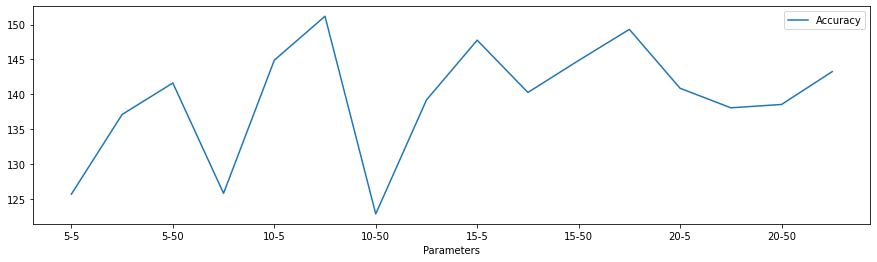

In [407]:
ResultsData.plot(x='Parameters', y='Accuracy', figsize=(15,4), kind='line')

In [410]:
# Fitting the ANN to the Training set
model.fit(X_train_scaled_DR_scaled, Y_train_scaled ,batch_size = 10, epochs = 10, verbose=0)

# Generating Predictions on testing data
Predictions=model.predict(X_test_scaled_DR_scaled)

# Scaling the predicted Price data back to original price scale
#Predictions=TargetVarScalerFit.inverse_transform(Predictions)

# Scaling the y_test Price data back to original price scale
#y_test_orig=TargetVarScalerFit.inverse_transform(y_test)

# Scaling the test data back to original scale
#Test_Data=PredictorScalerFit.inverse_transform(X_test)

#TestingData=pd.DataFrame(data=Test_Data, columns=Predictors)
#TestingData['Price']=y_test_orig


In [412]:
df_test['ANN_2']=Predictions


In [414]:
loss_functions(df_test['REAL'],df_test['ANN_2'])

Loss functions:
* R-squared = 0.7970156344359842
* RMSE = 0.21418753420785816
* MAE = 0.31757962899606385


In [415]:
# Function to generate Deep ANN model
def make_regression_ann(Optimizer_trial):
    from keras.models import Sequential
    from keras.layers import Dense

    model = Sequential()
    model.add(Dense(units=13, input_dim=13, kernel_initializer='normal', activation='relu'))
    model.add(Dense(units=5, kernel_initializer='normal', activation='relu'))
    model.add(Dense(1, kernel_initializer='normal'))
    model.compile(loss='mean_squared_error', optimizer=Optimizer_trial)
    return model

###########################################
from sklearn.model_selection import GridSearchCV
from keras.wrappers.scikit_learn import KerasRegressor

# Listing all the parameters to try
Parameter_Trials={'batch_size':[10,20,30],
                  'epochs':[10,20],
                  'Optimizer_trial':['adam', 'rmsprop']
                  }

# Creating the regression ANN model
RegModel=KerasRegressor(make_regression_ann, verbose=0)

###########################################
from sklearn.metrics import make_scorer

# Defining a custom function to calculate accuracy
def Accuracy_Score(orig,pred):
    MAPE = np.mean(100 * (np.abs(orig-pred)/orig))
    print('#'*70,'Accuracy:', 100-MAPE)
    return(100-MAPE)

custom_Scoring=make_scorer(Accuracy_Score, greater_is_better=True)

#########################################
# Creating the Grid search space
# See different scoring methods by using sklearn.metrics.SCORERS.keys()
grid_search=GridSearchCV(estimator=RegModel,
                         param_grid=Parameter_Trials,
                         scoring=custom_Scoring,
                         cv=5)

#########################################
# Measuring how much time it took to find the best params
import time
StartTime=time.time()

# Running Grid Search for different paramenters
grid_search.fit(X_train_scaled_DR_scaled,Y_train_scaled, verbose=1)

EndTime=time.time()
print("########## Total Time Taken: ", round((EndTime-StartTime)/60), 'Minutes')

print('### Printing Best parameters ###')
grid_search.best_params_

Epoch 1/10


<ipython-input-415-a16b50df7e3f>:24: DeprecationWarning: KerasRegressor is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  RegModel=KerasRegressor(make_regression_ann, verbose=0)


528/528 [==============================] - 1s 1ms/step - loss: 0.6904
Epoch 2/10
528/528 [==============================] - 1s 1ms/step - loss: 0.4285
Epoch 3/10
528/528 [==============================] - 1s 1ms/step - loss: 0.3574
Epoch 4/10
528/528 [==============================] - 1s 1ms/step - loss: 0.3154
Epoch 5/10
528/528 [==============================] - 1s 1ms/step - loss: 0.2912
Epoch 6/10
528/528 [==============================] - 1s 2ms/step - loss: 0.2749
Epoch 7/10
528/528 [==============================] - 1s 985us/step - loss: 0.2628
Epoch 8/10
528/528 [==============================] - 1s 956us/step - loss: 0.2522
Epoch 9/10
528/528 [==============================] - 1s 1ms/step - loss: 0.2442
Epoch 10/10
528/528 [==============================] - 1s 1ms/step - loss: 0.2364
###################################################################### Accuracy: 68.5799602639512
Epoch 1/10
528/528 [==============================] - 1s 1ms/step - loss: 0.5165
Epoch 2/10
528/52

{'Optimizer_trial': 'adam', 'batch_size': 10, 'epochs': 10}

#### ANN3


In [416]:
# build the model!
model = Sequential()
model.add(Dense(1000, input_shape=(X_train.shape[1],), activation='relu')) # (features,)
model.add(Dense(500, activation='relu'))
model.add(Dense(250, activation='relu'))
model.add(Dense(1, activation='linear')) # output node
model.summary() # see what your model looks like

# compile the model
model.compile(optimizer='rmsprop', loss='mse', metrics=['mae'])

# early stopping callback
es = EarlyStopping(monitor='val_loss',
                   mode='min',
                   patience=50,
                   restore_best_weights = True)

# fit the model!
# attach it to a new variable called 'history' in case
# to look at the learning curves
history = model.fit(X_train_scaled_DR_scaled, Y_train_scaled,
                    validation_data = (X_test_scaled_DR_scaled, Y_test_scaled),
                    callbacks=[es],
                    epochs=5000,
                    batch_size=50,
                    verbose=1)

Model: "sequential_82"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_240 (Dense)           (None, 1000)              14000     
                                                                 
 dense_241 (Dense)           (None, 500)               500500    
                                                                 
 dense_242 (Dense)           (None, 250)               125250    
                                                                 
 dense_243 (Dense)           (None, 1)                 251       
                                                                 
Total params: 640,001
Trainable params: 640,001
Non-trainable params: 0
_________________________________________________________________
Epoch 1/5000
132/132 [==============================] - 2s 12ms/step - loss: 0.3121 - mae: 0.3659 - val_loss: 0.2050 - val_mae: 0.3225
Epoch 2/5000
132/132 [======================

In [426]:
print(history.params)

{'verbose': 1, 'epochs': 5000, 'steps': 132}


In [427]:
print(history.history.keys())

dict_keys(['loss', 'mae', 'val_loss', 'val_mae'])


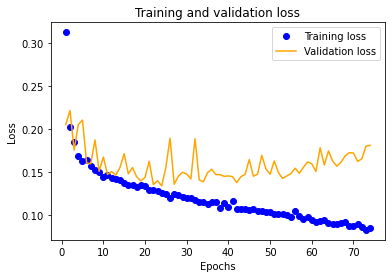

In [429]:
# let's see the training and validation accuracy by epoch
history_dict = history.history
loss_values = history_dict['loss'] # you can change this
val_loss_values = history_dict['val_loss'] # you can also change this
epochs = range(1, len(loss_values) + 1) # range of X (no. of epochs)
plt.plot(epochs, loss_values, 'bo', label='Training loss')
plt.plot(epochs, val_loss_values, 'orange', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

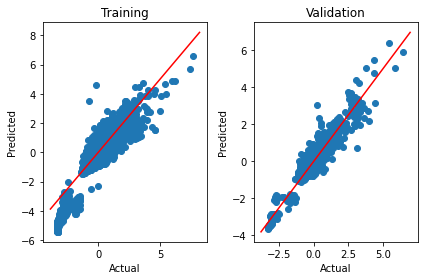

In [432]:
# scatterplot of actual vs. pred
# specify the dimensions
fig, axes = plt.subplots(1,2) # 1 row, 2 columns

# this makes the individual subplots
# Training Results
axes[0].scatter(x=Y_train_scaled, y=model.predict(X_train_scaled_DR)) #first row, first entry (left top)
axes[0].set_xlabel("Actual", fontsize=10)
axes[0].set_ylabel("Predicted",  fontsize=10)
axes[0].set_title("Training")
# add 45 deg line
x = np.linspace(*axes[0].get_xlim())
axes[0].plot(x, x, color='red')
# Validation Results
axes[1].scatter(x=df_test['REAL'], y=model.predict(X_test_scaled_DR_scaled)) # first row, second entry (right top)
axes[1].set_xlabel("Actual", fontsize=10)
axes[1].set_ylabel("Predicted",  fontsize=10)
axes[1].set_title("Validation")
# add 45 deg line
x = np.linspace(*axes[1].get_xlim())
axes[1].plot(x, x, color='red')

# tight layout
fig.tight_layout()

# show the plot
plt.show()

In [436]:
df_test['ANN_3']=model.predict(X_test_scaled_DR_scaled)

In [437]:
# How good is the model?
loss_functions(df_test['REAL'], df_test['ANN_3'])

Loss functions:
* R-squared = 0.873293410642528
* RMSE = 0.13369981410615425
* MAE = 0.26351330109652354


In [435]:
#Loss functions:
# R-squared = 0.873293410642528
# RMSE = 0.13369981410615425
# MAE = 0.26351330109652354

loss_functions(df_test['REAL'],model.predict(X_test_scaled_DR_scaled))


Loss functions:
* R-squared = 0.873293410642528
* RMSE = 0.13369981410615425
* MAE = 0.26351330109652354


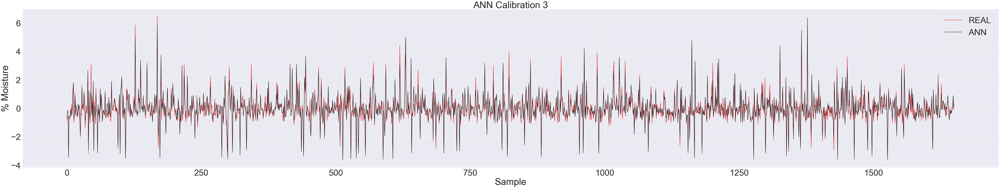

In [439]:
# Graph

sns.set(rc={'axes.facecolor':'gray', 'figure.facecolor':'gray'})
sns.set(font_scale=4)
fig, ax = plt.subplots(figsize=(90,15))
#ylim=(0,8251)
ax=sns.lineplot(y="REAL",x=range(0,1651) ,data=df_test, color="red") #REAL Values
sns.lineplot(y="ANN_3",x=range(0,1651),data=df_test, color="black").set(title='ANN Calibration 3') #Calibrated
plt.legend(labels = ['REAL', 'ANN'])
ax.set(ylabel="% Moisture",xlabel="Sample")
plt.show()

In [440]:
# metrics
pred = model.predict(X_test_scaled_DR_scaled)
pred

trainpreds = model.predict(X_train_scaled_DR_scaled)

from sklearn.metrics import mean_absolute_error
print(mean_absolute_error(Y_train_scaled, trainpreds)) # train
print(mean_absolute_error(Y_test_scaled, pred)) # test

0.22663208574394114
0.26351330109652354


In [28]:
#ANN3 with Dropout

from keras.layers import Dense, Dropout


In [897]:
# build the model!

# Insert the dropout layer
model = Sequential()
model.add(Dense(1000, input_shape=(X_train.shape[1],), activation='relu')) # (features,)
model.add(Dropout(0.5)) # specify a percentage between 0 and 0.5, or larger
model.add(Dense(500, activation='relu'))
model.add(Dropout(0.5)) # specify a percentage between 0 and 0.5, or larger
model.add(Dense(250, activation='relu'))
model.add(Dense(100, activation='relu'))
model.add(Dropout(0.5)) # specify a percentage between 0 and 0.5, or larger
model.add(Dense(1, activation='linear')) # output node
model.summary() # see what your model looks like
# compile the model
model.compile(optimizer='rmsprop', loss='mse', metrics=['mae'])

# early stopping callback
es = EarlyStopping(monitor='val_loss',
                   mode='min',
                   patience=50,
                   restore_best_weights = True)

# fit the model!
# attach it to a new variable called 'history' in case
# to look at the learning curves
history = model.fit(X_train_scaled_DR_scaled, Y_train_scaled,
                    validation_data = (X_test_scaled_DR_scaled, Y_test_scaled),
                    callbacks=[es],
                    epochs=5000,
                    batch_size=50,
                    verbose=1)

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_28 (Dense)            (None, 1000)              14000     
                                                                 
 dropout_12 (Dropout)        (None, 1000)              0         
                                                                 
 dense_29 (Dense)            (None, 500)               500500    
                                                                 
 dropout_13 (Dropout)        (None, 500)               0         
                                                                 
 dense_30 (Dense)            (None, 250)               125250    
                                                                 
 dense_31 (Dense)            (None, 100)               25100     
                                                                 
 dropout_14 (Dropout)        (None, 100)              

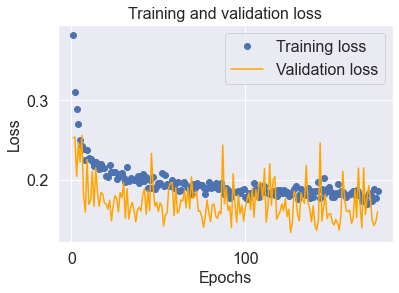

In [898]:
# let's see the training and validation accuracy by epoch
history_dict = history.history
loss_values = history_dict['loss'] # you can change this
val_loss_values = history_dict['val_loss'] # you can also change this
epochs = range(1, len(loss_values) + 1) # range of X (no. of epochs

plt.plot(epochs, loss_values, 'bo', label='Training loss')
plt.plot(epochs, val_loss_values, 'orange', label='Validation loss')
plt.title('Training and validation loss',fontsize=16)
plt.xlabel('Epochs',fontsize=16)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.ylabel('Loss',fontsize=16)
plt.legend(fontsize=16)
plt.show()


In [899]:
df_test['ANN_3_dropout']=model.predict(X_test_scaled_DR_scaled)
loss_functions(df_test['REAL'], df_test['ANN_3_dropout'])

Loss functions:
* R-squared = 0.873592512680158
* RMSE = 0.36521802248386437
* MAE = 0.2633865591490856
* MSE = 0.13338420394702447


In [ ]:

# Defining a function to find the best parameters for ANN
def FunctionFindBestParams(X_train, y_train, X_test, y_test):

    # Defining the list of hyper parameters to try
    batch_size_list=[60,70]
    epoch_list  =   [2000,2500,4000]


    SearchResultsData=pd.DataFrame(columns=['TrialNumber', 'Parameters', 'Accuracy'])

    # initializing the trials
    TrialNumber=0
    for batch_size_trial in batch_size_list:
        for epochs_trial in epoch_list:
            TrialNumber+=1
            model = Sequential()
            model.add(Dense(1000, input_shape=(X_train.shape[1],), activation='relu')) # (features,)
            model.add(Dropout(0.5)) # specify a percentage between 0 and 0.5, or larger
            model.add(Dense(500, activation='relu'))
            model.add(Dropout(0.5)) # specify a percentage between 0 and 0.5, or larger
            model.add(Dense(250, activation='relu'))
            model.add(Dropout(0.5)) # specify a percentage between 0 and 0.5, or larger
            model.add(Dense(1, activation='linear')) # output node
            model.summary() # see what your model looks like
            model.compile(optimizer='rmsprop', loss='mse', metrics=['mae'])

            # Fitting the ANN to the Training set
            model.fit(X_train_scaled_DR_scaled, Y_train_scaled,
                      validation_data = (X_test_scaled_DR_scaled, Y_test_scaled),

                      epochs=epochs_trial,
                      batch_size=batch_size_trial,
                      verbose=1)
            #model.fit(X_train, y_train ,batch_size = batch_size_trial, epochs = epochs_trial, verbose=0)

            MAPE = np.mean(100 * (np.abs(y_test-model.predict(X_test))/y_test))

            # printing the results of the current iteration
            print(TrialNumber, 'Parameters:','batch_size:', batch_size_trial,'-', 'epochs:',epochs_trial, 'Accuracy:', 100-MAPE)

            SearchResultsData=SearchResultsData.append(pd.DataFrame(data=[[TrialNumber, str(batch_size_trial)+'-'+str(epochs_trial), 100-MAPE]],
                                                                    columns=['TrialNumber', 'Parameters', 'Accuracy'] ))
    return(SearchResultsData)


######################################################
# Calling the function
ResultsData=FunctionFindBestParams(X_train_scaled_DR_scaled, Y_train_scaled, X_test_scaled_DR_scaled, Y_test_scaled)

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_4 (Dense)             (None, 1000)              14000     
                                                                 
 dropout_3 (Dropout)         (None, 1000)              0         
                                                                 
 dense_5 (Dense)             (None, 500)               500500    
                                                                 
 dropout_4 (Dropout)         (None, 500)               0         
                                                                 
 dense_6 (Dense)             (None, 250)               125250    
                                                                 
 dropout_5 (Dropout)         (None, 250)               0         
                                                                 
 dense_7 (Dense)             (None, 1)                

# Ensemble Method

##### - AdaBoost

In [518]:
from sklearn.ensemble import AdaBoostRegressor
from sklearn.tree import DecisionTreeRegressor

In [567]:
DTR=DecisionTreeRegressor(max_depth=50)
#rf = RandomForestRegressor(n_estimators = 70 ,random_state = 42, max_features='sqrt')
model_ABR = AdaBoostRegressor(n_estimators=70, base_estimator=DTR ,learning_rate=0.0001)
model_ABR.fit(X_train_scaled_DR_scaled,Y_train_scaled)

C:\Users\bkari\Anaconda3\lib\site-packages\sklearn\utils\validation.py:72: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



AdaBoostRegressor(base_estimator=DecisionTreeRegressor(max_depth=50),
                  learning_rate=0.0001, n_estimators=70)

In [568]:
df_test['AdaBoost_Pred']=model_ABR.predict(X_test_scaled_DR_scaled)

In [569]:
loss_functions(df_test['REAL'],df_test['AdaBoost_Pred'])

Loss functions:
* R-squared = 0.8570562443787533
* RMSE = 0.38837243271516675
* MAE = 0.24441480881827232
* MSE = 0.15083314649309673


#### Gradient Boosted Regression Tree

In [574]:
from sklearn.ensemble import GradientBoostingRegressor

In [613]:
gbr=GradientBoostingRegressor(max_depth=10,n_estimators=60,learning_rate=0.1,max_features='sqrt')
gbr.fit(X_train_scaled_DR_scaled,Y_train_scaled)

C:\Users\bkari\Anaconda3\lib\site-packages\sklearn\utils\validation.py:72: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



GradientBoostingRegressor(max_depth=10, max_features='sqrt', n_estimators=60)

In [614]:
df_test['GBR_Ensemble_Pred']=gbr.predict(X_test_scaled_DR_scaled)

In [615]:
loss_functions(df_test['REAL'],df_test['GBR_Ensemble_Pred'])

Loss functions:
* R-squared = 0.8726434946263754
* RMSE = 0.36658641609434656
* MAE = 0.25170033322629415
* MSE = 0.1343856004648974


##### Bagging Regressor

In [616]:
from sklearn.svm import SVR
from sklearn.ensemble import BaggingRegressor

In [623]:
regr_bagging = BaggingRegressor(base_estimator=SVR('rbf', gamma='scale', epsilon=0.39 , C=6), n_estimators=20)
regr_bagging.fit(X_train_scaled_DR_scaled,Y_train_scaled)
df_test['Bagging_Pred']=regr_bagging.predict(X_test_scaled_DR_scaled)

loss_functions(df_test['REAL'],df_test['Bagging_Pred'])

C:\Users\bkari\Anaconda3\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning:

Pass kernel=rbf as keyword args. From version 0.25 passing these as positional arguments will result in an error

C:\Users\bkari\Anaconda3\lib\site-packages\sklearn\utils\validation.py:72: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



Loss functions:
* R-squared = 0.8064511255062193
* RMSE = 0.4519195469691255
* MAE = 0.3147532191516065
* MSE = 0.20423127693277965


##### Ensemble Averaging Method

In [653]:
svr_rbf = SVR(kernel = 'rbf', gamma='scale', epsilon=0.39 , C=6)
rf = RandomForestRegressor(n_estimators = 70 ,random_state = 42, max_features='sqrt')
knn = KNeighborsRegressor(n_neighbors = 10,p = 1)
svr_lin = SVR(kernel = 'linear', gamma='scale', C=5)#, gamma=C = 1e3)

In [886]:
model_1=svr_rbf.fit(X_train_scaled_DR_scaled,Y_train_scaled)
model_2=rf.fit(X_train_scaled_DR_scaled,Y_train_scaled)
model_3=knn.fit(X_train_scaled_DR_scaled,Y_train_scaled)
model_4=svr_lin.fit(X_train_scaled_DR_scaled,Y_train_scaled)

C:\Users\bkari\Anaconda3\lib\site-packages\sklearn\utils\validation.py:72: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

<ipython-input-886-e915f8cbd1b8>:2: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\bkari\Anaconda3\lib\site-packages\sklearn\utils\validation.py:72: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



In [887]:
# predicting the output on the validation dataset
pred_1 = pd.DataFrame(model_1.predict(X_test_scaled_DR_scaled))
pred_2 = pd.DataFrame(model_2.predict(X_test_scaled_DR_scaled))
pred_3 = pd.DataFrame(model_3.predict(X_test_scaled_DR_scaled))
pred_4=  pd.DataFrame(model_4.predict(X_test_scaled_DR_scaled))


In [888]:
# final prediction after averaging on the prediction of all 3 models
pred_final = (pred_1+pred_2+pred_3+pred_4)/4.0
df_test['AVG_ENSMBL']=pred_final
loss_functions(df_test['REAL'],df_test['AVG_ENSMBL'])


Loss functions:
* R-squared = 0.8517859649999919
* RMSE = 0.39546719784750783
* MAE = 0.2716178714291213
* MSE = 0.1563943045733599


##### Stacking Model

In [664]:
# importing stacking lib
#!pip install vecstack
# importing stacking lib
from vecstack import stacking

In [800]:
model_1 = Ridge(alpha=0.98)#SVR(kernel = 'rbf', gamma='scale', epsilon=0.39 , C=6)
model_2 = RandomForestRegressor(n_estimators = 70 ,random_state = 42, max_features='sqrt')
model_3 = KNeighborsRegressor(n_neighbors = 10,p = 1)
model_4=SVR(kernel = 'linear', gamma='scale', C=5)#, gamma=C = 1e3)

In [893]:
# putting all base model objects in one list
all_models = [model_1, model_2, model_3, model_4]

# computing the stack features
s_train, s_test = stacking(all_models, X_train=X_train_scaled_DR_scaled, X_test=X_test_scaled_DR_scaled,y_train=Y_train_scaled, regression=True, n_folds=10)

C:\Users\bkari\Anaconda3\lib\site-packages\sklearn\utils\validation.py:72: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\bkari\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:293: FutureWarning:

Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.



In [894]:
#second level model
final_model=lin_reg=LinearRegression()#KNeighborsRegressor(n_neighbors = 21,p = 1) #both Linear Reg and KNN lead to same results!

In [895]:
# initializing the second-level model
#final_model = model_3

# fitting the second level model with stack features
final_model = final_model.fit(s_train, Y_train_scaled)

# predicting the final output using stacking
pred_final = final_model.predict(s_test)

In [896]:
loss_functions(df_test['REAL'],pred_final)

Loss functions:
* R-squared = 0.8822563600668785
* RMSE = 0.3524800407466709
* MAE = 0.24173075576490957
* MSE = 0.12424217912477475
